# Exploring our data to find its characterastics and gain main insights

In [167]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib as plt

import matplotlib.pyplot as plt
plt.style.use('fivethirtyeight')

In [168]:
df = pd.read_csv('../Files/FinalFinalFinalClean.csv')



In [169]:
df.columns

Index(['fid', 'fname', 'fruntime', 'fimdb_rating', 'fimdb_votes', 'fimd',
       'fdirector', 'fwriter', 'fassistant_directors', 'fcinematographers',
       'fcomposers', 'feditors', 'fproducer', 'fenglish', 'fmulti_lang', 'fus',
       'fmulti_country', 'fmystery', 'fmusic', 'faction', 'fsport', 'fmusical',
       'ffamily', 'fcomedy', 'fhorror', 'ffantasy', 'fdrama', 'fsci-fi',
       'fthriller', 'fwestern', 'fadventure', 'fhistory', 'fwar', 'fcrime',
       'fromance', 'fbiography', 'fanimation', 'actW', 'nominated', 'Won',
       'month', 'year', 'certificate_G', 'certificate_PG', 'certificate_PG-13',
       'certificate_R', 'certificate_Unrated', 'fproduction_BBC Films',
       'fproduction_Columbia Pictures', 'fproduction_Dimension Films',
       'fproduction_DreamWorks', 'fproduction_Fox Searchlight Pictures',
       'fproduction_Lionsgate', 'fproduction_Millennium Films',
       'fproduction_New Line Cinema', 'fproduction_Paramount Pictures',
       'fproduction_Screen Gems', 

In [170]:
df[['fname','fbudget_y','fGross_y','fcumlative_y']]

,fname,fbudget_y,fGross_y,fcumlative_y
0,Kate & Leopold,48000000.0,47121859.0,76019048.0
1,The Fantasticks,10000000.0,49666.0,49666.0
2,Glitter,22000000.0,4274407.0,5271666.0
3,In the Mood for Love,147845551.4,2738980.0,12854953.0
4,The Dancer Upstairs,13326925.7,2377348.0,5227348.0
...,...,...,...,...
6693,Capernaum,4000000.0,1661096.0,64398132.0
6694,The Specials,1439171.9,355660654.3,15496959.0
6695,Bala (Hindi),20886735.7,346071373.0,1370210.0
6696,Sita,834029.9,346951160.9,6954.0


In [171]:
df.shape

(6698, 65)

In [172]:
df.isnull().sum().sum()

0

In [173]:
# eda_data.drop_duplicates(keep='first', inplace=True)
# eda_data.reset_index(drop=True,inplace=True)

In [174]:
df.columns

Index(['fid', 'fname', 'fruntime', 'fimdb_rating', 'fimdb_votes', 'fimd',
       'fdirector', 'fwriter', 'fassistant_directors', 'fcinematographers',
       'fcomposers', 'feditors', 'fproducer', 'fenglish', 'fmulti_lang', 'fus',
       'fmulti_country', 'fmystery', 'fmusic', 'faction', 'fsport', 'fmusical',
       'ffamily', 'fcomedy', 'fhorror', 'ffantasy', 'fdrama', 'fsci-fi',
       'fthriller', 'fwestern', 'fadventure', 'fhistory', 'fwar', 'fcrime',
       'fromance', 'fbiography', 'fanimation', 'actW', 'nominated', 'Won',
       'month', 'year', 'certificate_G', 'certificate_PG', 'certificate_PG-13',
       'certificate_R', 'certificate_Unrated', 'fproduction_BBC Films',
       'fproduction_Columbia Pictures', 'fproduction_Dimension Films',
       'fproduction_DreamWorks', 'fproduction_Fox Searchlight Pictures',
       'fproduction_Lionsgate', 'fproduction_Millennium Films',
       'fproduction_New Line Cinema', 'fproduction_Paramount Pictures',
       'fproduction_Screen Gems', 

Tukeys method number of outliers is 315
90% confidence interval has 1 values between 106 and 107


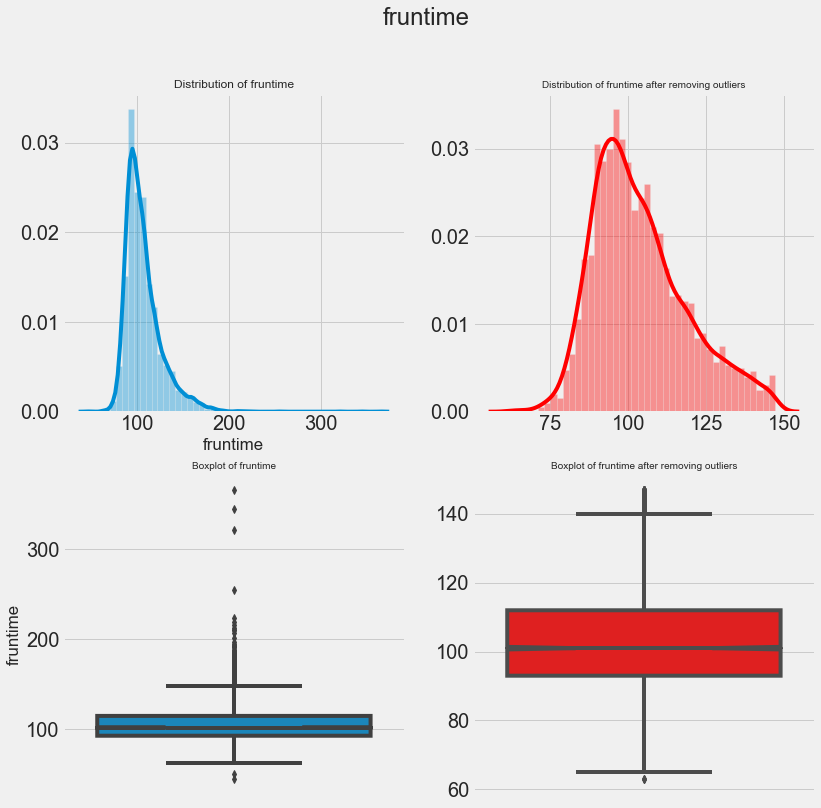

In [175]:
def no_outlier(Data_column,data_set):
    import math
    X = data_set[Data_column]
    no_outlier = []
    confidence = []
    
    q1 = float(X.describe()['25%'])
    q3 = float(X.describe()['75%'])
    iqr = (q3 - q1)*1.5
    std = float(X.describe()['std'])
    mean = float(X.describe()['mean'])
    lower_limit = mean-(1.645*(std/math.sqrt(len(X))))
    higher_limit = mean+(1.645*(std/math.sqrt(len(X))))
    
    for total in X:
        if lower_limit < total < higher_limit:
            confidence.append(total)
        
        if (q1 - iqr) < (total) < (q3 + iqr):
            no_outlier.append(total)
        else:
            pass
    print('Tukeys method number of outliers is {}'.format((len(X)-len(sorted(no_outlier)))))
    print('90% confidence interval has {} values between {} and {}'.format(len(sorted(confidence)),round(lower_limit),round(higher_limit)))
    
    fig, ax = plt.subplots(ncols=2, nrows=2, figsize=(12, 12))
    sns.distplot(X, ax=ax[0,0])
    sns.distplot(no_outlier,color='red', ax=ax[0,1])
    sns.boxplot(X,notch=True,orient='v',ax=ax[1,0])
    sns.boxplot(no_outlier,notch=True,orient='v',color='red',ax=ax[1,1])
    
    fig.suptitle('{}'.format(Data_column), fontsize=24)
    ax[0,0].set_title('Distribution of {}'.format(Data_column), fontsize=12)
    ax[0,1].set_title('Distribution of {} after removing outliers'.format(Data_column), fontsize=10)
    ax[1,0].set_title('Boxplot of {}'.format(Data_column), fontsize=10)
    ax[1,1].set_title('Boxplot of {} after removing outliers'.format(Data_column), fontsize=10)
    
no_outlier('fruntime',df)

In [176]:
def dummy_finances(df,array):
    import collections
    
    mul_list_dict = collections.defaultdict(list)
    rating = []
    runtime = []
    imdb_votes = []
    
    for i in range(0,df.shape[0]):
        for j in array.columns:
            if df[j][i] != 0:
                a = str(df[j])
                mul_list_dict['{}_budget'.format(j)].append(df['fbudget_y'][i])
                mul_list_dict['{}_Gross'.format(j)].append(df['fGross_y'][i])
                mul_list_dict['{}_cumlative'.format(j)].append(df['fcumlative_y'][i])
                mul_list_dict['{}_fimdb_rating'.format(j)].append(df['fimdb_rating'][i])
                mul_list_dict['{}_runtime'.format(j)].append(df['fruntime'][i])
                mul_list_dict['{}_imdb_votes'.format(j)].append(df['fimdb_votes'][i])
                
                
    genre_title = []
    genre_budget = []
    genre_Gross = []
    genre_cumilative = []
    frating = []
    fruntime = []
    fvotes = []
    
    for i in array:
        genre_title.append(i)
        genre_budget.append(int((sum(mul_list_dict['{}_budget'.format(i)]))/(len(mul_list_dict['{}_budget'.format(i)]))))
        genre_Gross.append(int((sum(mul_list_dict['{}_Gross'.format(i)]))/(len(mul_list_dict['{}_Gross'.format(i)]))))
        genre_cumilative.append(int((sum(mul_list_dict['{}_cumlative'.format(i)]))/(len(mul_list_dict['{}_cumlative'.format(i)]))))
        frating.append(int((sum(mul_list_dict['{}_fimdb_rating'.format(i)]))/(len(mul_list_dict['{}_fimdb_rating'.format(i)]))))
        fruntime.append(int((sum(mul_list_dict['{}_runtime'.format(i)]))/(len(mul_list_dict['{}_runtime'.format(i)]))))
        fvotes.append(int((sum(mul_list_dict['{}_imdb_votes'.format(i)]))/(len(mul_list_dict['{}_imdb_votes'.format(i)]))))
       
        
    
    
    return pd.DataFrame({'title':genre_title,'budget_avg':genre_budget,'Gross_avg':genre_Gross,'cumilative_avg':genre_cumilative,\
                        'fimdb_rating':frating,'runtime':fruntime,'votes':fvotes})

    

In [177]:
# genre = df[['fcomedy', 'fadult', 'fdocumentary', 'fmystery',
#        'fadventure', 'fbiography', 'fshort', 'fnews', 'fthriller', 'ffamily',
#        'fhistory', 'fcrime', 'fhorror', 'ftalk-show', 'fwar', 'fgame-show',
#        'freality-tv', 'fwestern', 'faction', 'fmusical', 'fsport', 'fmusic',
#        'fanimation', 'fromance', 'fsci-fi', 'ffantasy', 'fdrama']]
 
 
 
# certeficate = df[['certificate_Not Rated', 'certificate_PG',
#        'certificate_PG-13', 'certificate_R', 'certificate_Unrated']]
 
# production = df[['fproduction_Columbia Pictures', 'fproduction_Dimension Films',
#        'fproduction_DreamWorks', 'fproduction_Fox 2000 Pictures',
#        'fproduction_Fox Searchlight Pictures', 'fproduction_Lionsgate',
#        'fproduction_New Line Cinema', 'fproduction_Paramount Pictures',
#        'fproduction_Screen Gems', 'fproduction_Summit Entertainment',
#        'fproduction_Touchstone Pictures', 'fproduction_Twentieth Century Fox',
#        'fproduction_Universal Pictures', 'fproduction_Walt Disney Pictures',
#        'fproduction_Warner Bros', 'fproduction_other']]

### Genre

In [344]:
#df[['fruntime','fimdb_rating','fimdb_votes']]

In [345]:
df.columns

Index(['fid', 'fname', 'fruntime', 'fimdb_rating', 'fimdb_votes', 'fimd',
       'fdirector', 'fwriter', 'fassistant_directors', 'fcinematographers',
       'fcomposers', 'feditors', 'fproducer', 'fenglish', 'fmulti_lang', 'fus',
       'fmulti_country', 'fmystery', 'fmusic', 'faction', 'fsport', 'fmusical',
       'ffamily', 'fcomedy', 'fhorror', 'ffantasy', 'fdrama', 'fsci_fi',
       'fthriller', 'fwestern', 'fadventure', 'fhistory', 'fwar', 'fcrime',
       'fromance', 'fbiography', 'fanimation', 'actW', 'nominated', 'Won',
       'month', 'year', 'certificate_G', 'certificate_PG', 'certificate_PG-13',
       'certificate_R', 'certificate_Unrated', 'fproduction_BBC Films',
       'fproduction_Columbia Pictures', 'fproduction_Dimension Films',
       'fproduction_DreamWorks', 'fproduction_Fox Searchlight Pictures',
       'fproduction_Lionsgate', 'fproduction_Millennium Films',
       'fproduction_New Line Cinema', 'fproduction_Paramount Pictures',
       'fproduction_Screen Gems', 

In [346]:
df.rename(columns = {'fsci-fi':'fsci_fi','freality-tv':'freality_tv','fgame-show':'fgame_show','ftalk-show':'ftalk_show'},inplace = True)

In [347]:
 genre = df[['fcomedy', 'fmystery','fadventure', 'fbiography', 'fthriller', 'ffamily',
        'fhistory', 'fcrime', 'fhorror',  'fwar', 'fwestern', 'faction', 'fmusical', 'fsport', 'fmusic',
        'fanimation', 'fromance', 'fsci_fi', 'ffantasy', 'fdrama']]

In [348]:
genre_discription = dummy_finances(df,genre)

In [349]:
genre_discription

,title,budget_avg,Gross_avg,cumilative_avg,fimdb_rating,runtime,votes
0,fcomedy,34613083,98235649,52708914,6,102,47044
1,fmystery,31694518,103603937,50138898,6,104,70200
2,fadventure,73797644,137505971,207647405,6,107,140074
3,fbiography,28692159,61180196,36121037,6,115,63726
4,fthriller,33262650,113200709,48704736,6,106,69909
5,ffamily,63604445,121826644,175852519,6,98,78217
6,fhistory,32745951,71192778,41338284,6,121,56399
7,fcrime,29431793,99916867,34860480,6,107,60809
8,fhorror,24132375,123322997,29272181,5,97,40703
9,fwar,35358857,84725728,45187688,6,118,61989


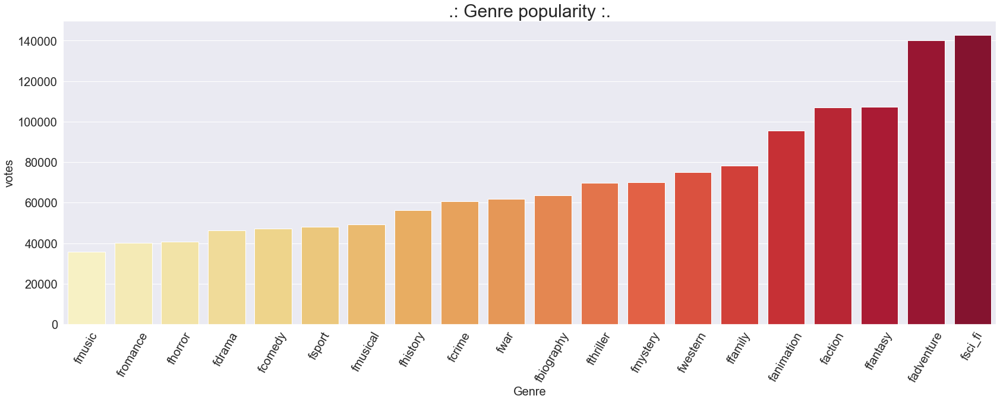

In [354]:
f, ax = plt.subplots(figsize=(23, 9))
sns.barplot(x = 'title', y = 'votes', data=genre_discription.sort_values(by=['votes']),palette='YlOrRd')
ax.set_title('.: Genre popularity :.',size=30)
ax.set_xlabel('Genre',size=20)
plt.xticks(rotation=60)                                                               
plt.tight_layout()
plt.xticks(size=20)
plt.yticks(size=20)
ax.set_ylabel('votes',size=20)
plt.show()

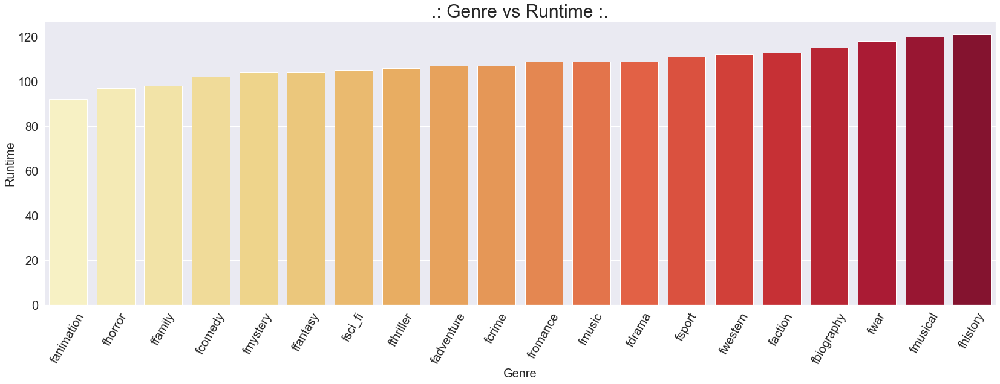

In [357]:
f, ax = plt.subplots(figsize=(23, 9))
sns.barplot(x = 'title', y = 'runtime',palette='YlOrRd', data=genre_discription.sort_values(by=['runtime']))
ax.set_title('.: Genre vs Runtime :.',size=30)
ax.set_xlabel('Genre',size=20)
plt.xticks(rotation=60) 
plt.xticks(size=20)
plt.yticks(size=20)
plt.tight_layout()
ax.set_ylabel('Runtime',size=20)
plt.show()

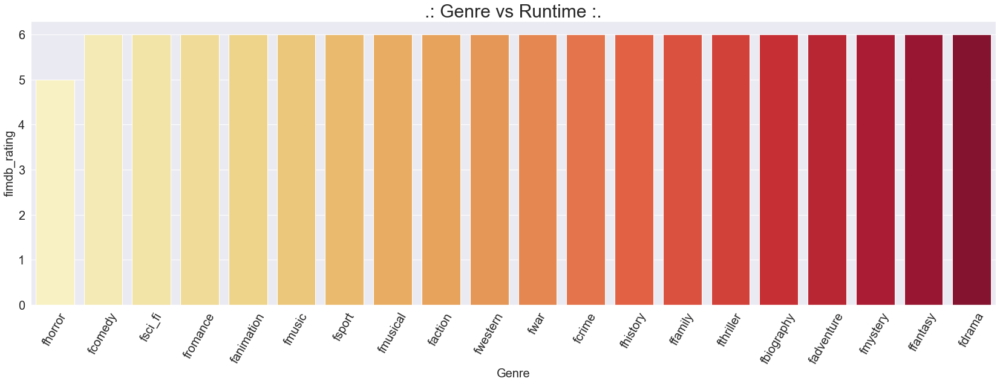

In [358]:
f, ax = plt.subplots(figsize=(23, 9))
sns.barplot(x = 'title', y = 'fimdb_rating',palette='YlOrRd', data=genre_discription.sort_values(by=['fimdb_rating']))
ax.set_title('.: Genre vs Runtime :.',size=30)
ax.set_xlabel('Genre',size=20)
plt.xticks(rotation=60) 
plt.xticks(size=20)
plt.yticks(size=20)
plt.tight_layout()
ax.set_ylabel('fimdb_rating',size=20)
plt.show()

In [402]:
genre_discription.set_index(['title'],inplace=True)
genre_discription.head()

,budget_avg,Gross_avg,cumilative_avg,fimdb_rating,runtime,votes
title,,,,,,
fcomedy,34613083,98235649,52708914,6,102,47044
fmystery,31694518,103603937,50138898,6,104,70200
fadventure,73797644,137505971,207647405,6,107,140074
fbiography,28692159,61180196,36121037,6,115,63726
fthriller,33262650,113200709,48704736,6,106,69909


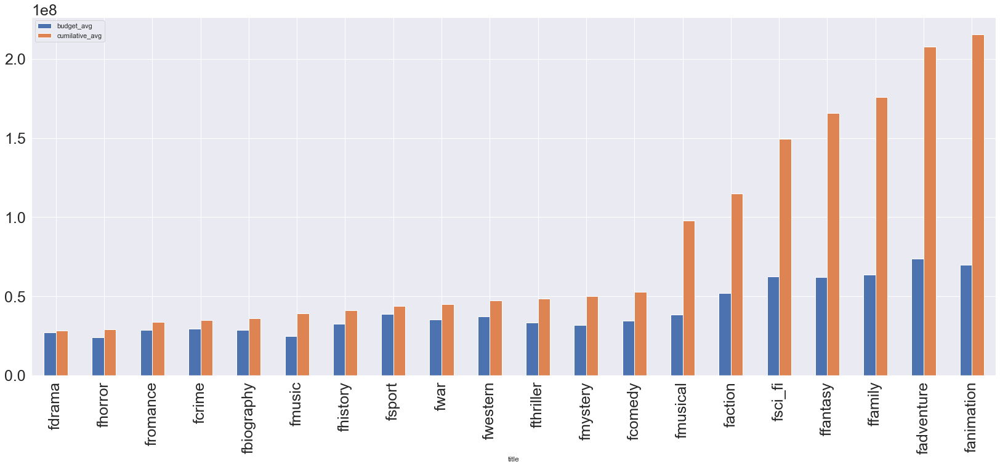

In [411]:
import matplotlib
genre_discription[['budget_avg','cumilative_avg']].sort_values(by=['cumilative_avg']).plot(kind='bar',figsize=(25,10))
matplotlib.rc('xtick', labelsize=30)     
matplotlib.rc('ytick', labelsize=30)

# matplotlib.rc('xtick', labelsize=15) 
# matplotlib.rc('xtick', labelsize=15) 

## Production

In [390]:
df.columns

Index(['fid', 'fname', 'fruntime', 'fimdb_rating', 'fimdb_votes', 'fimd',
       'fdirector', 'fwriter', 'fassistant_directors', 'fcinematographers',
       'fcomposers', 'feditors', 'fproducer', 'fenglish', 'fmulti_lang', 'fus',
       'fmulti_country', 'fmystery', 'fmusic', 'faction', 'fsport', 'fmusical',
       'ffamily', 'fcomedy', 'fhorror', 'ffantasy', 'fdrama', 'fsci_fi',
       'fthriller', 'fwestern', 'fadventure', 'fhistory', 'fwar', 'fcrime',
       'fromance', 'fbiography', 'fanimation', 'actW', 'nominated', 'Won',
       'month', 'year', 'certificate_G', 'certificate_PG', 'certificate_PG-13',
       'certificate_R', 'certificate_Unrated', 'fproduction_BBC Films',
       'fproduction_Columbia Pictures', 'fproduction_Dimension Films',
       'fproduction_DreamWorks', 'fproduction_Fox Searchlight Pictures',
       'fproduction_Lionsgate', 'fproduction_Millennium Films',
       'fproduction_New Line Cinema', 'fproduction_Paramount Pictures',
       'fproduction_Screen Gems', 

In [391]:
production = df[['fproduction_BBC Films', 'fproduction_Columbia Pictures',
        'fproduction_Dimension Films', 'fproduction_DreamWorks',
        'fproduction_Fox Searchlight Pictures', 'fproduction_Lionsgate',
        'fproduction_Millennium Films', 'fproduction_New Line Cinema',
        'fproduction_Paramount Pictures', 'fproduction_Screen Gems',
        'fproduction_Summit Entertainment', 'fproduction_Twentieth Century Fox',
        'fproduction_Universal Pictures', 'fproduction_Walt Disney Pictures',
        'fproduction_other']]

In [392]:
production_describtion = dummy_finances(df,production)

In [393]:
production_describtion.head()

,title,budget_avg,Gross_avg,cumilative_avg,fimdb_rating,runtime,votes
0,fproduction_BBC Films,28441815,108611293,8490596,6,102,20110
1,fproduction_Columbia Pictures,66057992,81756953,181889889,6,110,160946
2,fproduction_Dimension Films,44698325,55634540,57275395,5,97,94885
3,fproduction_DreamWorks,47352830,55502276,112792004,6,114,137295
4,fproduction_Fox Searchlight Pictures,34895137,23376606,46154517,6,104,102898


In [396]:
production_describtion['title'] = production_describtion['title'].apply(lambda x : x.strip('fproduction_'))

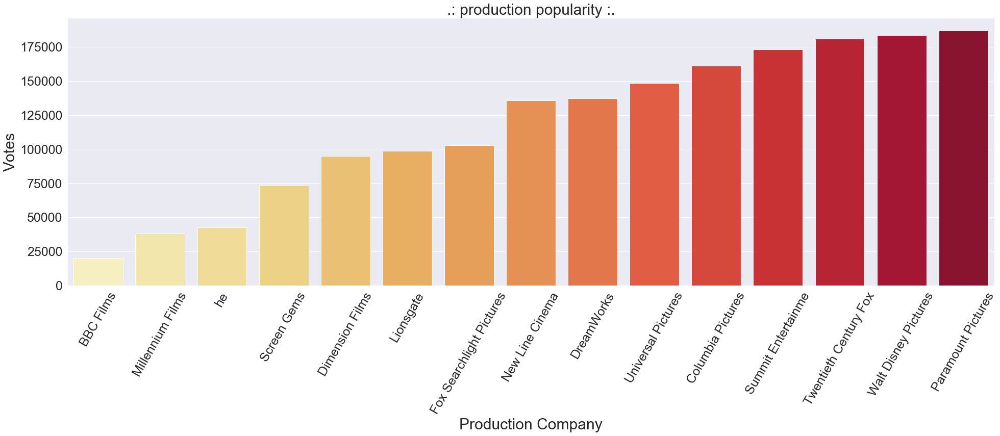

In [397]:
f, ax = plt.subplots(figsize=(29, 9))
sns.barplot(x = 'title', y = 'votes', data=production_describtion.sort_values(by=['votes']),palette='YlOrRd')
ax.set_title('.: production popularity :.',size=30)
ax.set_xlabel('Production Company',size=30)
ax.set_ylabel('Votes',size=30)
plt.xticks(size=25)
plt.yticks(size=25)
plt.xticks(rotation=60) 
plt.show()

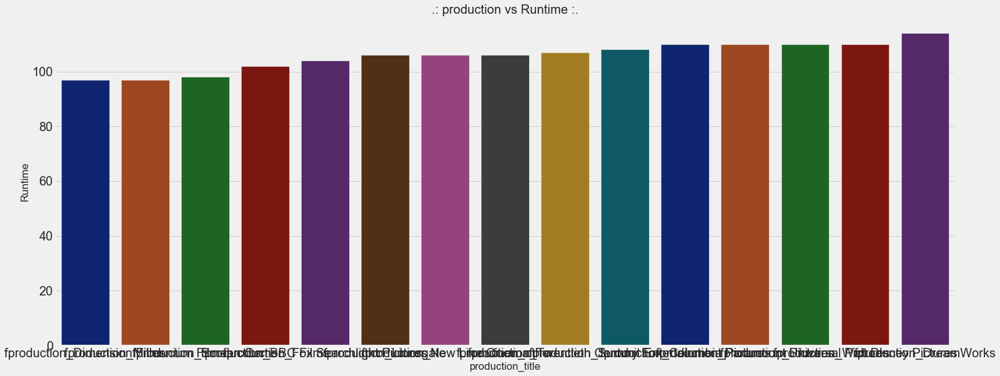

In [193]:
f, ax = plt.subplots(figsize=(23, 9))
sns.barplot(x = 'title', y = 'runtime',palette='dark', data=production_describtion.sort_values(by=['runtime']))
ax.set_title('.: production vs Runtime :.')
ax.set_xlabel('production_title')
ax.set_ylabel('Runtime')
plt.show()

In [399]:
production_describtion.set_index(['title'],inplace=True)
production_describtion.head()

,budget_avg,Gross_avg,cumilative_avg,fimdb_rating,runtime,votes
title,,,,,,
BBC Films,28441815,108611293,8490596,6,102,20110
Columbia Pictures,66057992,81756953,181889889,6,110,160946
Dimension Films,44698325,55634540,57275395,5,97,94885
DreamWorks,47352830,55502276,112792004,6,114,137295
Fox Searchlight Pictures,34895137,23376606,46154517,6,104,102898


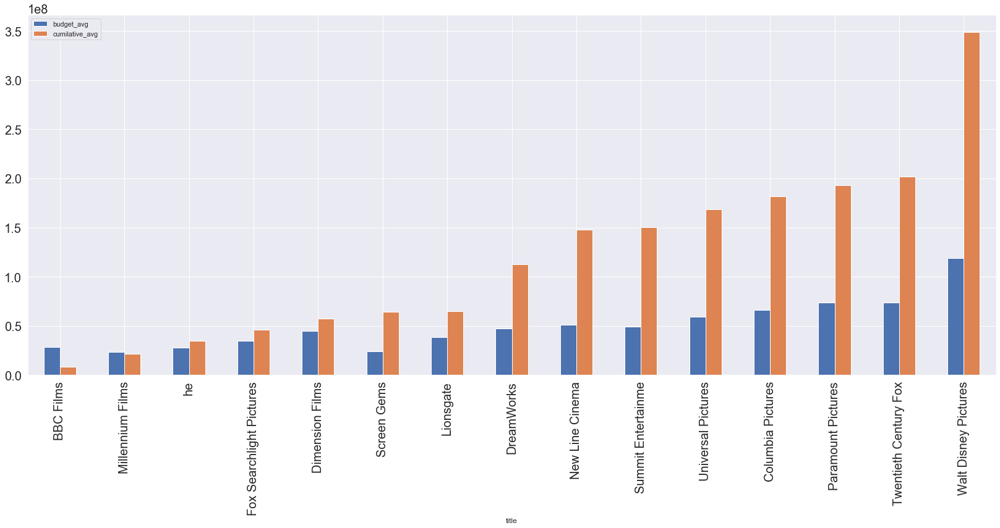

In [417]:
production_describtion[['budget_avg','cumilative_avg']].sort_values(by=['cumilative_avg']).plot(kind='bar',figsize=(25,10))
matplotlib.rc('xtick', labelsize=15)     
matplotlib.rc('ytick', labelsize=15)

## certificates

In [196]:
certeficate = df[['certificate_G', 'certificate_PG','certificate_PG-13', 'certificate_R', 'certificate_Unrated']]

In [197]:
certeficate_describtion = dummy_finances(df,certeficate)

In [198]:
certeficate_describtion.head()

,title,budget_avg,Gross_avg,cumilative_avg,fimdb_rating,runtime,votes
0,certificate_G,54534642,132017082,148847133,6,90,83517
1,certificate_PG,54784685,83628933,146607953,6,101,67121
2,certificate_PG-13,49542777,79780721,111194939,6,107,103857
3,certificate_R,27783739,63565247,29051327,6,103,58778
4,certificate_Unrated,23565745,156590505,7023458,6,115,13521


In [266]:
certeficate_describtion['title'] = certeficate_describtion['title'].apply(lambda x : x.strip('certificate_'))

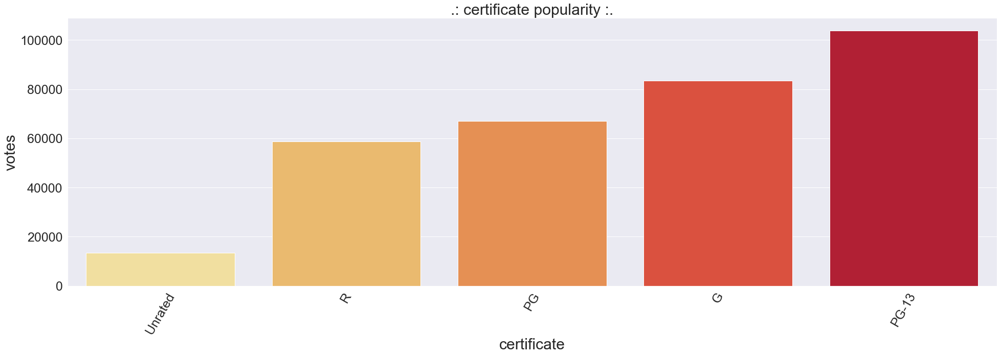

In [360]:
f, ax = plt.subplots(figsize=(29, 9))
sns.barplot(x = 'title', y = 'votes', data=certeficate_describtion.sort_values(by=['votes']),palette='YlOrRd')
ax.set_title('.: certificate popularity :.',size=30)
ax.set_xlabel('certificate',size=30)
ax.set_ylabel('votes',size=30)
plt.xticks(size=25)
plt.yticks(size=25)
plt.xticks(rotation=60) 
plt.show()

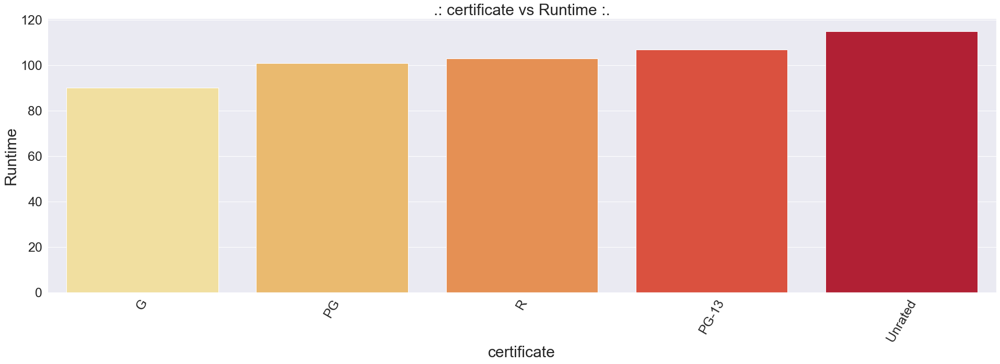

In [361]:
f, ax = plt.subplots(figsize=(29, 9))
sns.barplot(x = 'title', y = 'runtime', data=certeficate_describtion.sort_values(by=['runtime']),palette='YlOrRd')
ax.set_title('.: certificate vs Runtime :.',size=30)
ax.set_xlabel('certificate',size=30)
ax.set_ylabel('Runtime',size=30)
plt.xticks(size=25)
plt.yticks(size=25)
plt.xticks(rotation=60) 
plt.show()

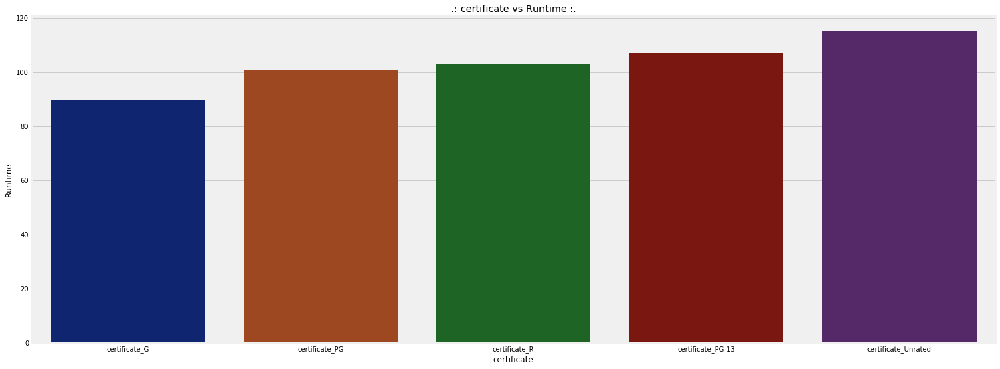

In [60]:
f, ax = plt.subplots(figsize=(23, 9))
sns.barplot(x = 'title', y = 'runtime',palette='dark', data=certeficate_describtion.sort_values(by=['runtime']))
ax.set_title('.: certificate vs Runtime :.')
ax.set_xlabel('certificate')
ax.set_ylabel('Runtime')
plt.show()

In [418]:
certeficate_describtion.set_index(['title'],inplace=True)
certeficate_describtion.head()

,budget_avg,Gross_avg,cumilative_avg,fimdb_rating,runtime,votes
title,,,,,,
G,54534642,132017082,148847133,6,90,83517
PG,54784685,83628933,146607953,6,101,67121
PG-13,49542777,79780721,111194939,6,107,103857
R,27783739,63565247,29051327,6,103,58778
Unrated,23565745,156590505,7023458,6,115,13521


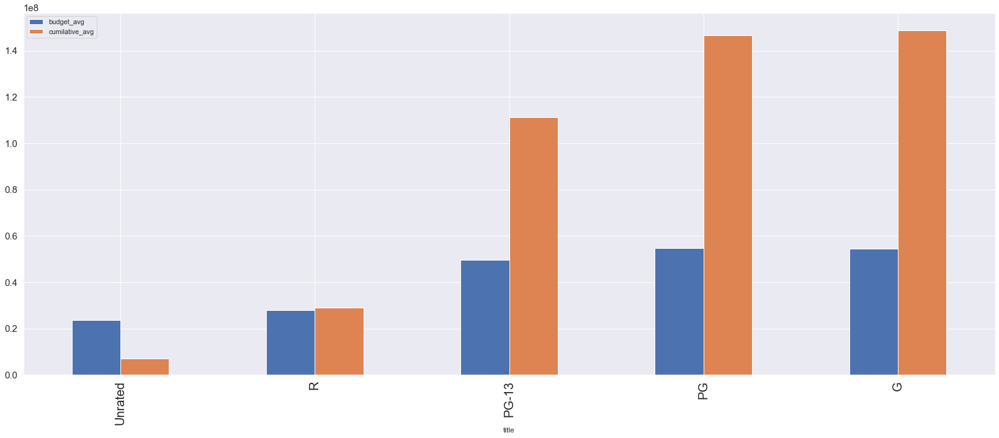

In [422]:
certeficate_describtion[['budget_avg','cumilative_avg']].sort_values(by=['cumilative_avg']).plot(kind='bar',figsize=(25,10))
matplotlib.rc('xtick', labelsize=20)
matplotlib.rc('ytick', labelsize=20)


## Month

In [206]:
month_map = {1:'Jan', 2:'Feb', 3:'Mar', 4:'Apr', 5:'May', 6:'Jun', 
             7:'Jul', 8:'Aug', 9:'Sep', 10:'Oct', 11:'Nov', 12:'Dec'} 

df['month'] = df['month'].map(month_map)

In [207]:
df['month'].value_counts()


Oct    725
Sep    687
Apr    616
Aug    587
Nov    578
Mar    555
Jan    555
Dec    509
May    491
Jun    490
Feb    465
Jul    440
Name: month, dtype: int64

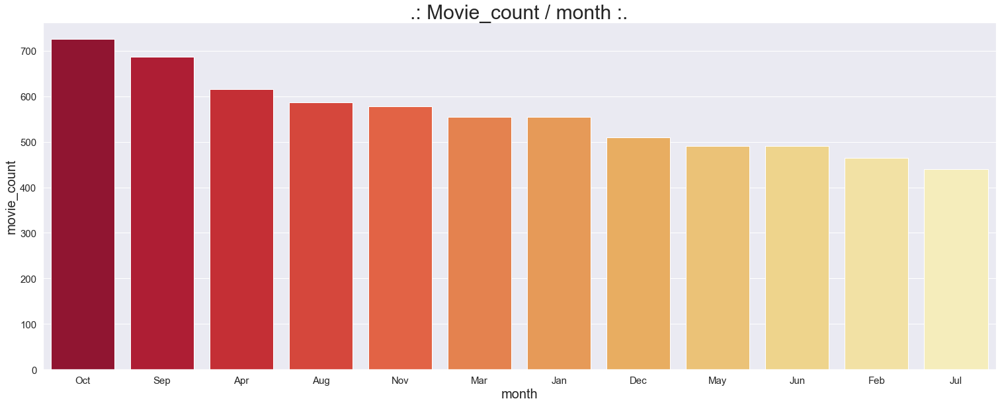

In [336]:

f, ax = plt.subplots(figsize=(23, 9))
sns.set(style="darkgrid")
ax = sns.countplot(x="month",order = df['month'].value_counts().index, data=df,palette='YlOrRd_r')
ax.set_title('.: Movie_count / month :.',size=30)
ax.set_xlabel('month',size=20)
ax.set_ylabel('movie_count',size=20)
plt.xticks(size=15)
plt.yticks(size=15)
plt.show()


In [224]:
grouped_months = df.groupby('month') 

In [225]:
grouped_months['fGross_y'].mean()

month
Apr    1.024266e+08
Aug    9.143114e+07
Dec    1.345347e+08
Feb    1.213723e+08
Jan    9.199875e+07
Jul    1.070904e+08
Jun    1.173684e+08
Mar    1.058853e+08
May    1.020149e+08
Nov    1.227680e+08
Oct    1.021240e+08
Sep    1.042257e+08
Name: fGross_y, dtype: float64

In [226]:
grouped_months['fbudget_y'].mean()

month
Apr    2.621111e+07
Aug    3.090094e+07
Dec    3.707419e+07
Feb    3.232776e+07
Jan    2.671523e+07
Jul    4.071208e+07
Jun    4.110139e+07
Mar    3.502718e+07
May    4.153933e+07
Nov    3.623618e+07
Oct    2.688754e+07
Sep    2.528488e+07
Name: fbudget_y, dtype: float64

In [227]:
grouped_months['fcumlative_y'].mean()

month
Apr    2.736169e+07
Aug    3.814662e+07
Dec    8.591780e+07
Feb    4.340156e+07
Jan    3.693515e+07
Jul    9.291733e+07
Jun    8.120065e+07
Mar    5.274038e+07
May    7.918438e+07
Nov    7.491902e+07
Oct    3.111053e+07
Sep    2.627824e+07
Name: fcumlative_y, dtype: float64

In [ ]:
f, ax = plt.subplots(figsize=(23, 9))
sns.set(style="darkgrid")
ax = sns.countplot(x="month",order = df['month'].value_counts().index,data=df,palette='YlOrRd_r')
ax.set_title('.: Movie_count / month :.',size=30)
ax.set_xlabel('month',size=20)
ax.set_ylabel('movie_count',size=20)
plt.xticks(size=15)
plt.show()

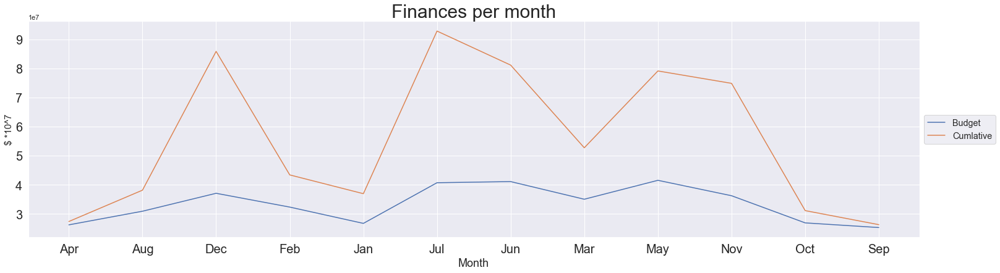

In [301]:
f, ax = plt.subplots(figsize=(23, 6))
plt.plot(grouped_months['fbudget_y'].mean(), label="Budget")
#plt.plot(grouped_months['fGross_y'].mean(), label="Gross")
plt.plot(grouped_months['fcumlative_y'].mean(), label="Cumlative")
# Add legend
#plt.legend(loc='lower left')

plt.legend(loc='center left', bbox_to_anchor=(1, 0.5),fontsize='large')


# Add title and x, y labels
plt.title("Finances per month", fontsize=30)#, fontweight='bold')
plt.xlabel("Month",size=18)
plt.ylabel("$ *10^7",size=15)
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()

In [ ]:
f, ax = plt.subplots(figsize=(23, 4))
plt.plot(grouped_months[['fbudget_y']].mean(), label="Budget")

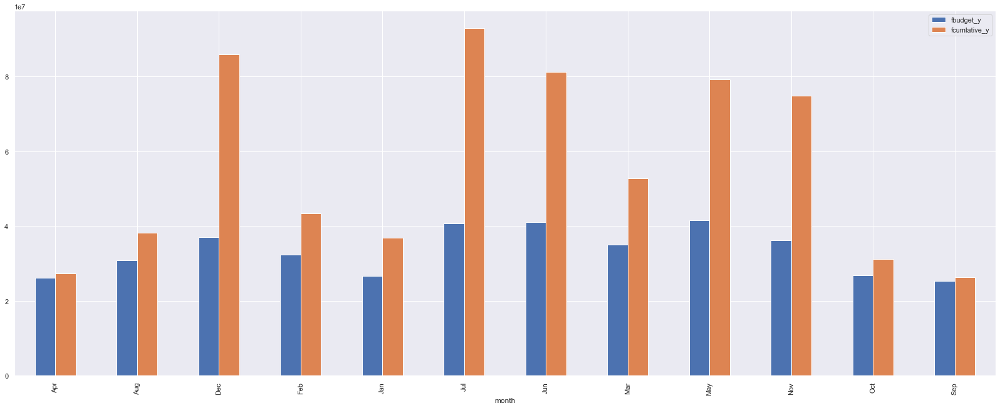

In [254]:
grouped_months[['fbudget_y','fcumlative_y']].mean().plot(kind='bar',figsize=(25,10))

In [314]:
df.columns

Index(['fid', 'fname', 'fruntime', 'fimdb_rating', 'fimdb_votes', 'fimd',
       'fdirector', 'fwriter', 'fassistant_directors', 'fcinematographers',
       'fcomposers', 'feditors', 'fproducer', 'fenglish', 'fmulti_lang', 'fus',
       'fmulti_country', 'fmystery', 'fmusic', 'faction', 'fsport', 'fmusical',
       'ffamily', 'fcomedy', 'fhorror', 'ffantasy', 'fdrama', 'fsci_fi',
       'fthriller', 'fwestern', 'fadventure', 'fhistory', 'fwar', 'fcrime',
       'fromance', 'fbiography', 'fanimation', 'actW', 'nominated', 'Won',
       'month', 'year', 'certificate_G', 'certificate_PG', 'certificate_PG-13',
       'certificate_R', 'certificate_Unrated', 'fproduction_BBC Films',
       'fproduction_Columbia Pictures', 'fproduction_Dimension Films',
       'fproduction_DreamWorks', 'fproduction_Fox Searchlight Pictures',
       'fproduction_Lionsgate', 'fproduction_Millennium Films',
       'fproduction_New Line Cinema', 'fproduction_Paramount Pictures',
       'fproduction_Screen Gems', 

In [363]:
grouped_months['fimdb_rating'].mean()

month
Apr    6.082305
Aug    6.196082
Dec    6.277210
Feb    6.091183
Jan    6.167568
Jul    6.160227
Jun    6.203878
Mar    6.285405
May    6.226477
Nov    6.422318
Oct    6.270069
Sep    6.237846
Name: fimdb_rating, dtype: float64

In [365]:
monthss = []
for i in grouped_months['fimdb_votes'].mean().index:
    monthss.append(i)
    
votess = []
for i in grouped_months['fimdb_votes'].mean().values:
    votess.append(i)
    
rating = []
for i in grouped_months['fimdb_rating'].mean().values:
    rating.append(i)


In [366]:
a = pd.DataFrame({'month':monthss,'votes':votess,'rating':rating})

In [326]:
grouped_months['fimdb_votes'].mean()

month
Apr    35941.818182
Aug    49044.781942
Dec    85382.428291
Feb    51734.335484
Jan    56294.994595
Jul    83858.497727
Jun    71353.071429
Mar    54737.169369
May    67818.211813
Nov    71399.043253
Oct    51099.160000
Sep    37846.168850
Name: fimdb_votes, dtype: float64

In [367]:
a

,month,votes,rating
0,Apr,35941.818182,6.082305
1,Aug,49044.781942,6.196082
2,Dec,85382.428291,6.277210
3,Feb,51734.335484,6.091183
4,Jan,56294.994595,6.167568
5,Jul,83858.497727,6.160227
6,Jun,71353.071429,6.203878
7,Mar,54737.169369,6.285405
8,May,67818.211813,6.226477
9,Nov,71399.043253,6.422318


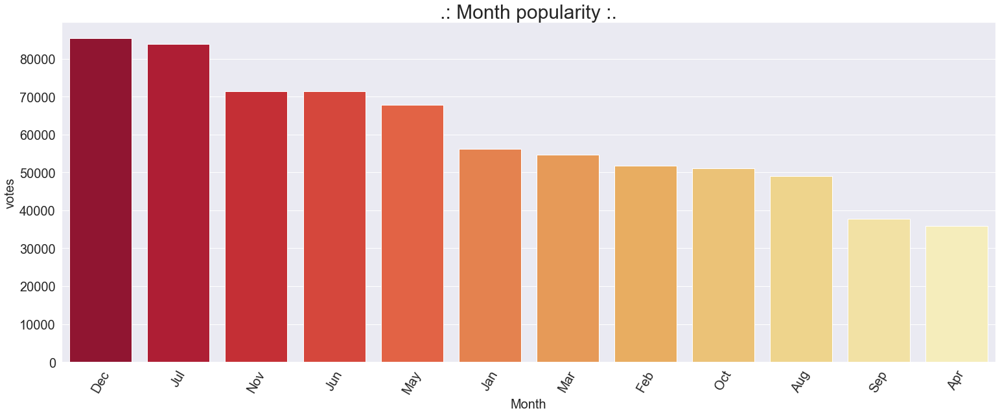

In [337]:
f, ax = plt.subplots(figsize=(23, 9))
sns.barplot(x = 'month', y = 'votes', data=a.sort_values(by=['votes'],ascending=False),palette='YlOrRd_r')
ax.set_title('.: Month popularity :.',size=30)
ax.set_xlabel('Month',size=20)
plt.xticks(rotation=60)                                                               
ax.set_ylabel('votes',size=20)
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()

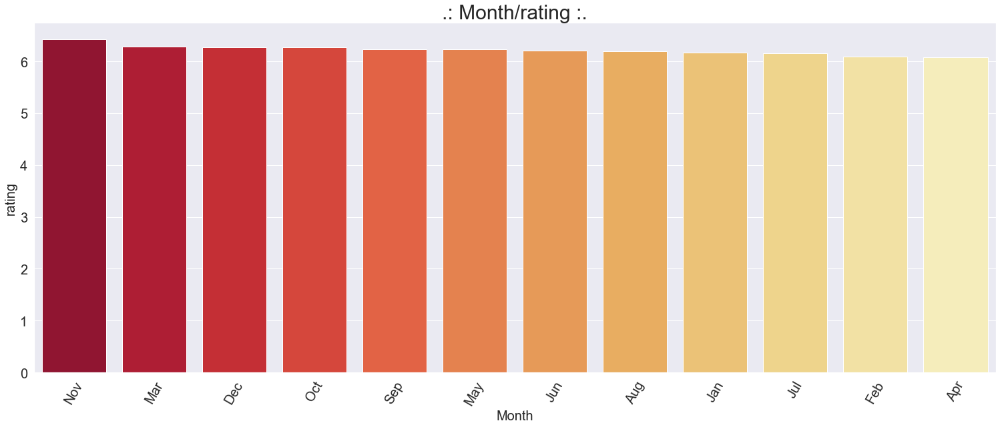

In [369]:
f, ax = plt.subplots(figsize=(23, 9))
sns.barplot(x = 'month', y = 'rating', data=a.sort_values(by=['rating'],ascending=False),palette='YlOrRd_r')
ax.set_title('.: Month/rating :.',size=30)
ax.set_xlabel('Month',size=20)
plt.xticks(rotation=60)                                                               
ax.set_ylabel('rating',size=20)
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()

## find the relation of number of nomination and getting the Oscar 

In [78]:
N_W = df[['Won','nominated']]
N_W['wXn'] = N_W['Won'] * N_W['nominated']
N_W['wXn'].head(50)

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


0      0.0
1      0.0
2      0.0
3      0.0
4      0.0
5      0.0
6      0.0
7      0.0
8      0.0
9      0.0
10     0.0
11    13.0
12     0.0
13     0.0
14     0.0
15     0.0
16     2.0
17     0.0
18     0.0
19     0.0
20     0.0
21     2.0
22     0.0
23     0.0
24     0.0
25     0.0
26     0.0
27     0.0
28     0.0
29     0.0
30     0.0
31     0.0
32     0.0
33     0.0
34     0.0
35     7.0
36     0.0
37     0.0
38     0.0
39     0.0
40     0.0
41     0.0
42     0.0
43     0.0
44     1.0
45     0.0
46     0.0
47     0.0
48     0.0
49     0.0
Name: wXn, dtype: float64

In [81]:
df.columns

Index(['fid', 'fname', 'fruntime', 'fimdb_rating', 'fimdb_votes', 'fimd',
       'fdirector', 'fwriter', 'fassistant_directors', 'fcinematographers',
       'fcomposers', 'feditors', 'fproducer', 'fenglish', 'fmulti_lang', 'fus',
       'fmulti_country', 'fmystery', 'fmusic', 'faction', 'fsport', 'fmusical',
       'ffamily', 'fcomedy', 'fhorror', 'ffantasy', 'fdrama', 'fsci_fi',
       'fthriller', 'fwestern', 'fadventure', 'fhistory', 'fwar', 'fcrime',
       'fromance', 'fbiography', 'fanimation', 'actW', 'nominated', 'Won',
       'month', 'year', 'certificate_G', 'certificate_PG', 'certificate_PG-13',
       'certificate_R', 'certificate_Unrated', 'fproduction_BBC Films',
       'fproduction_Columbia Pictures', 'fproduction_Dimension Films',
       'fproduction_DreamWorks', 'fproduction_Fox Searchlight Pictures',
       'fproduction_Lionsgate', 'fproduction_Millennium Films',
       'fproduction_New Line Cinema', 'fproduction_Paramount Pictures',
       'fproduction_Screen Gems', 

In [82]:
gen_dfcol = ['fbiography',  'fdrama', 'fcomedy',
       'fcrime', 'fadventure',  'ffantasy', 'fthriller',
       'fmystery', 'fromance', 'fwestern', 'fmusic',
       'fanimation', 'fsci_fi', 'ffamily',  'fmusical',
       'fsport', 'fhistory', 'fhorror', 'fwar', 'faction', 'nominated','Won']
gen_df = df[gen_dfcol]

In [83]:
won_gen_df = gen_df

In [285]:
wdict = {'fbiography':[],  'fdrama':[], 'fcomedy':[],
       'fcrime':[], 'fadventure':[],  'ffantasy':[], 'fthriller':[],
       'fmystery':[], 'fromance':[], 'fwestern':[], 'fmusic':[],
       'fanimation':[],  'fsci_fi':[], 'ffamily':[],  'fmusical':[],
       'fsport':[], 'fhistory':[], 'fhorror':[], 'fwar':[], 'faction':[], 'Won':won_gen_df['Won']}
for index, row in won_gen_df.iterrows():
    for c in ['fbiography',  'fdrama', 'fcomedy',
       'fcrime', 'fadventure', 'ffantasy', 'fthriller',
       'fmystery', 'fromance', 'fwestern', 'fmusic', 
       'fanimation', 'fsci_fi', 'ffamily', 'fmusical',
       'fsport', 'fhistory', 'fhorror', 'fwar', 'faction']:
#        try:
        wdict[c].append(row["Won"] if row[c]  ==1 else 0)
        print(c,'done')
#        except:
            #print(row["Won"])

fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily d

fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done

fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcom

fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done

fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcom

fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory do

fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fd

ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
fa

fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fa

fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily d

fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport don

fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fr

fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbi

fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fr

fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fw

fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fr

ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
fa

fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fr

fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fr

fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror d

fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrim

ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmy

fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcom

fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport don

ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmy

fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport don

fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily d

fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthri

fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fa

fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical don

fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffa

ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
fa

fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical don

ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
fa

fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadvent

fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror d

ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
fa

fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrim

fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror d

ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmy

fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrim

fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fa

fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done

fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fd

fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffa

fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done

fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrim

fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fd

ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmy

fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done


fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbi

fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbi

fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily d

fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily d

ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
fa

fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fd

fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fw

fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrim

fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbi

fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fr

fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport don

fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrim

fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fa

fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily d

fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrim

fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbi

fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthri

fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done


faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi d

fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fw

fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fa

fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fw

fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical don

fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport don

fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fw

fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done


fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcom

fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthri

fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcom

fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffa

faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi d

fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily d

ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmy

fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fw

fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrim

fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffa

fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthri

fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fd

fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fa

fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fa

fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fw

fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical don

ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
fa

fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily d

fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily d

fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadvent

fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical don

fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrim

fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror d

fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fr

fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror d

fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fd

fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbi

ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmy

fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport don

fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcom

fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthri

fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport don

fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffa

fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport don

fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical don

fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical don

fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily d

fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily d

fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadvent

fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadvent

fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done


faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi d

ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
fa

fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrim

fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done


fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done

ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
fa

fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcom

fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbi

fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fa

ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmy

fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fd

fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done


fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrim

fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbi

faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi d

fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fw

fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory do

ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
fa

fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily d

fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fr

fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily d

ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
fa

fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fr

fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily d

fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory do

fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory do

ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmy

ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
fa

fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport don

fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror d

fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthri

fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport don

fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical don

fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical don

fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffa

fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily d

fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily d

fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadvent

fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily d

In [86]:
df_won = pd.DataFrame.from_dict(wdict)

In [87]:
gen_won_sum = df_won.sum()

In [88]:
gen_sum = won_gen_df.sum()

In [89]:
WON = pd.DataFrame()

In [90]:
WON ['gen_won_sum'] = gen_won_sum
WON ['gen_sum'] = gen_sum

In [91]:
#WON['gen_won_average'] = WON['gen_won_sum'].apply(lambda WON['gen_sum']/WON['gen_won_sum'])
w_avrg = []
for index, row in WON.iterrows():
    
    w_avrg.append(row ['gen_won_sum'] / row ['gen_sum'] )
WON['WonAVG'] = w_avrg

In [102]:
WON['Genre'] = WON.index
WON.sort_values(by='gen_sum')

,gen_won_sum,gen_sum,WonAVG,Genre
fwestern,4.0,77.0,0.051948,fwestern
fmusical,7.0,155.0,0.045161,fmusical
Won,159.0,159.0,1.000000,Won
fsport,2.0,196.0,0.010204,fsport
fmusic,11.0,249.0,0.044177,fmusic
fanimation,17.0,260.0,0.065385,fanimation
fwar,18.0,282.0,0.063830,fwar
fhistory,21.0,289.0,0.072664,fhistory
fbiography,36.0,459.0,0.078431,fbiography
ffamily,25.0,498.0,0.050201,ffamily


In [93]:
w = pd.DataFrame()
w = WON[['gen_won_sum','Genre']]
w.info()

<class 'pandas.core.frame.DataFrame'>
Index: 21 entries, fbiography to Won
Data columns (total 2 columns):
gen_won_sum    21 non-null float64
Genre          21 non-null object
dtypes: float64(1), object(1)
memory usage: 504.0+ bytes


In [97]:
new_w = w[w['Genre'] != 'Won']

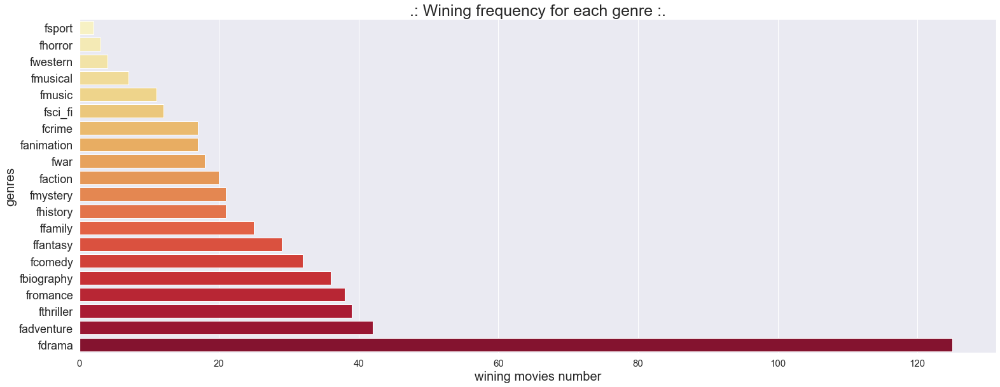

In [278]:
f, ax = plt.subplots(figsize=(23, 9))
sns.barplot(x = 'gen_won_sum', y = 'Genre', data=new_w.sort_values(by='gen_won_sum'),palette='YlOrRd')
ax.set_title('.: Wining frequency for each genre :.',size=25)
ax.set_xlabel('wining movies number',size=20)
ax.set_ylabel('genres',size=20)
plt.xticks(size=15)
plt.yticks(size=18)
plt.show()

#### Nominated

In [286]:
nom_gen_df = gen_df

In [294]:
nom_gen_df.columns

Index(['fbiography', 'fdrama', 'fcomedy', 'fcrime', 'fadventure', 'ffantasy',
       'fthriller', 'fmystery', 'fromance', 'fwestern', 'fmusic', 'fanimation',
       'fsci_fi', 'ffamily', 'fmusical', 'fsport', 'fhistory', 'fhorror',
       'fwar', 'faction', 'nominated', 'Won'],
      dtype='object')

In [287]:
ndict = {'fbiography':[],  'fdrama':[], 'fcomedy':[],
       'fcrime':[], 'fadventure':[],  'ffantasy':[], 'fthriller':[],
       'fmystery':[], 'fromance':[], 'fwestern':[], 'fmusic':[],
       'fanimation':[],  'fsci_fi':[], 'ffamily':[],  'fmusical':[],
       'fsport':[], 'fhistory':[], 'fhorror':[], 'fwar':[], 'faction':[], 'Won':won_gen_df['Won']}
for index, row in nom_gen_df.iterrows():
    for c in ['fbiography',  'fdrama', 'fcomedy',
       'fcrime', 'fadventure', 'ffantasy', 'fthriller',
       'fmystery', 'fromance', 'fwestern', 'fmusic', 
       'fanimation', 'fsci_fi', 'ffamily', 'fmusical',
       'fsport', 'fhistory', 'fhorror', 'fwar', 'faction']:
#        try:
        ndict[c].append(row["nominated"] if row[c]  ==1 else 0)
        print(c,'done')
#        except:
            #print(row["Won"])

fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily d

fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fr

fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory do

ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmy

fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory do

ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmy

fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport don

fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthri

fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport don

fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthri

fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fa

fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical don

fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcom

fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffa

fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport don

fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily d

fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily d

fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadvent

fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrim

fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory do

faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi d

fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrim

fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcom

fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fw

fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done

fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fa

fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fd

fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadvent

faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi d

fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fd

fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory do

fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done


fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fr

fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbi

fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily d

ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
fa

fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbi

fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fw

ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmy

fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done


fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fr

ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
fa

fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily d

ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmy

fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily d

fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical don

fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror d

fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fw

fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcom

fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical don

fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fw

fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffa

fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily d

fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffa

fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fw

fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbi

fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadvent

fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory do

faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi d

fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrim

fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fr

faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi d

fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthri

fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcom

fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done

fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done

ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
fa

fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fd

faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi d

fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fr

fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done


fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbi

fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffa

fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done


fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory do

ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
fa

faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi d

ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
fa

fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done


fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fd

fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily d

fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadvent

fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fa

fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fw

ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmy

fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadvent

fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbi

fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fr

fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical don

fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily d

fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbi

fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical don

fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fd

fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily d

faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi d

fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffa

fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical don

faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi d

fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrim

faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi d

fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcom

fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done

fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcom

fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done

fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fd

fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fa

fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fd

fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fd

fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done


fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbi

fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done


fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror d

fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fw

ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
fa

fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadvent

fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fw

fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror d

fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fw

fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror d

fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fr

ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmy

fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory do

ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmy

fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport don

fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fr

fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthri

fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fd

fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthri

fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fa

fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical don

fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily d

fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffa

fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fr

fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily d

fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadvent

fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical don

faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi d

fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done

faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi d

fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fr

fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcom

fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fa

fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done

faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi d

fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fd

fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory do

fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done


fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fd

fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done

fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical don

fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done

fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done


fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbi

fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffa

fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbi

fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrim

fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrim

fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fr

fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffa

fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror done
fwar done
faction done
fbiography done
fdrama done
fcomedy done
fcrime done
fadventure done
ffantasy done
fthriller done
fmystery done
fromance done
fwestern done
fmusic done
fanimation done
fsci_fi done
ffamily done
fmusical done
fsport done
fhistory done
fhorror d

In [288]:
df_nom = pd.DataFrame.from_dict(ndict)

In [289]:
gen_nom_sum = df_nom.sum()

In [290]:
gen_sum_n = nom_gen_df.sum()

In [291]:
NOM = pd.DataFrame()

In [295]:
NOM ['gen_nom_sum'] = gen_nom_sum
NOM ['gen_sum'] = gen_sum_n

#WON['gen_won_average'] = WON['gen_won_sum'].apply(lambda WON['gen_sum']/WON['gen_won_sum'])
n_avrg = []
for index, row in NOM.iterrows():

    n_avrg.append(row ['gen_nom_sum'] / row ['gen_sum'] )
NOM['NomAVG'] = n_avrg

NOM['Genre'] = NOM.index
NOM.head()

n = pd.DataFrame()
n = NOM[['gen_nom_sum','Genre']]
n.info()


<class 'pandas.core.frame.DataFrame'>
Index: 21 entries, fbiography to Won
Data columns (total 2 columns):
gen_nom_sum    21 non-null float64
Genre          21 non-null object
dtypes: float64(1), object(1)
memory usage: 504.0+ bytes


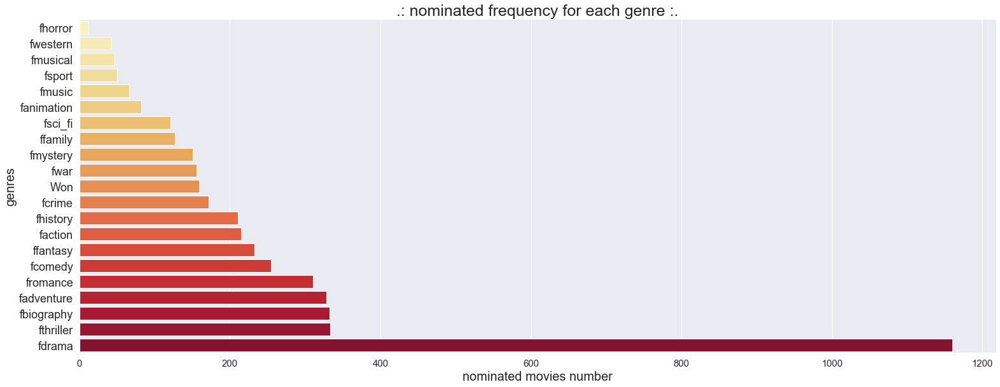

In [296]:
f, ax = plt.subplots(figsize=(23, 9))
sns.barplot(x = 'gen_nom_sum', y = 'Genre', data=n.sort_values(by='gen_nom_sum'),palette='YlOrRd')
ax.set_title('.: nominated frequency for each genre :.',size=25)
ax.set_xlabel('nominated movies number',size=20)
ax.set_ylabel('genres',size=20)
plt.xticks(size=15)
plt.yticks(size=18)
plt.show()



### votes/runtime

In [374]:
temp_x = df[df['fruntime'] < 250]

In [383]:
temp_x['fimdb_votes'].mean()

58178.86106961458

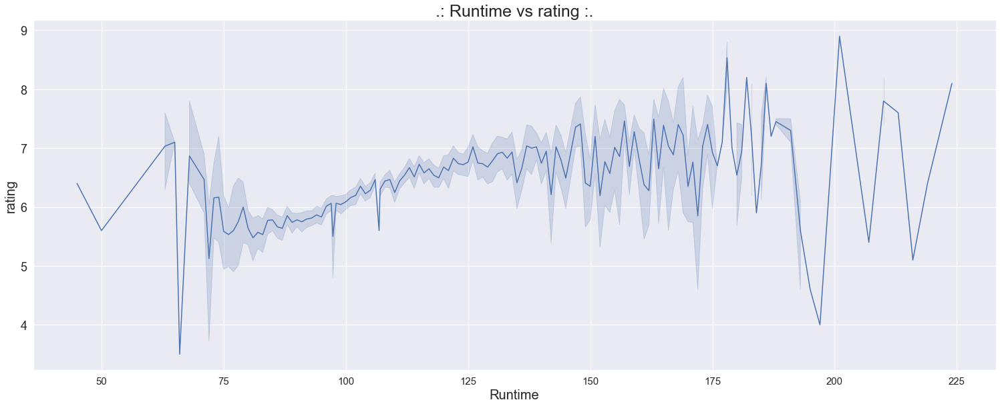

In [302]:
df.columns

Index(['fid', 'fname', 'fruntime', 'fimdb_rating', 'fimdb_votes', 'fimd',
       'fdirector', 'fwriter', 'fassistant_directors', 'fcinematographers',
       'fcomposers', 'feditors', 'fproducer', 'fenglish', 'fmulti_lang', 'fus',
       'fmulti_country', 'fmystery', 'fmusic', 'faction', 'fsport', 'fmusical',
       'ffamily', 'fcomedy', 'fhorror', 'ffantasy', 'fdrama', 'fsci_fi',
       'fthriller', 'fwestern', 'fadventure', 'fhistory', 'fwar', 'fcrime',
       'fromance', 'fbiography', 'fanimation', 'actW', 'nominated', 'Won',
       'month', 'year', 'certificate_G', 'certificate_PG', 'certificate_PG-13',
       'certificate_R', 'certificate_Unrated', 'fproduction_BBC Films',
       'fproduction_Columbia Pictures', 'fproduction_Dimension Films',
       'fproduction_DreamWorks', 'fproduction_Fox Searchlight Pictures',
       'fproduction_Lionsgate', 'fproduction_Millennium Films',
       'fproduction_New Line Cinema', 'fproduction_Paramount Pictures',
       'fproduction_Screen Gems', 

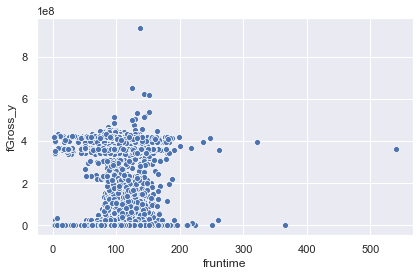

In [43]:
sns.scatterplot(x='fruntime',y='fGross_y',data=df)

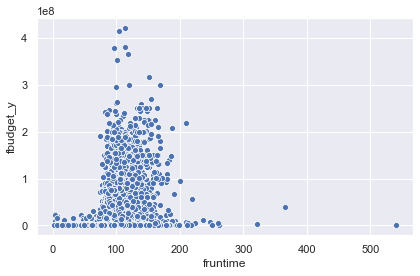

In [42]:
sns.scatterplot(x='fruntime',y='fbudget_y',data=df)

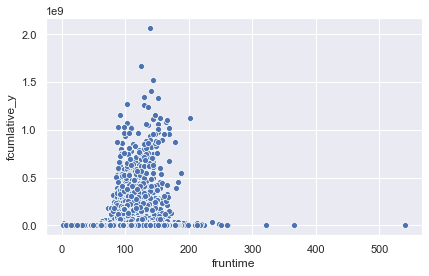

In [44]:
sns.scatterplot(x='fruntime',y='fcumlative_y',data=df)

In [25]:
certeficate = df[['certificate_G','certificate_PG','certificate_PG-13', 'certificate_R', 'certificate_Unrated']]

In [26]:
def dummy_finances(df,array):
    import collections
    
    mul_list_dict = collections.defaultdict(list)
    rating = []
    runtime = []
    imdb_votes = []
    
    for i in range(0,df.shape[0]):
        for j in array.columns:
            if df[j][i] != 0:
                a = str(df[j])
                mul_list_dict['{}_budget'.format(j)].append(df['fbudget_y'][i])
                mul_list_dict['{}_Gross'.format(j)].append(df['fGross_y'][i])
                mul_list_dict['{}_cumlative'.format(j)].append(df['fcumlative_y'][i])
                mul_list_dict['{}_fimdb_rating'.format(j)].append(df['fimdb_rating'][i])
                mul_list_dict['{}_runtime'.format(j)].append(df['fruntime'][i])
                mul_list_dict['{}_imdb_votes'.format(j)].append(df['fimdb_votes'][i])
                
                
    genre_title = []
    genre_budget = []
    genre_Gross = []
    genre_cumilative = []
    frating = []
    fruntime = []
    fvotes = []
    
    for i in array:
        genre_title.append(i)
        genre_budget.append(int((sum(mul_list_dict['{}_budget'.format(i)]))/(len(mul_list_dict['{}_budget'.format(i)]))))
        genre_Gross.append(int((sum(mul_list_dict['{}_Gross'.format(i)]))/(len(mul_list_dict['{}_Gross'.format(i)]))))
        genre_cumilative.append(int((sum(mul_list_dict['{}_cumlative'.format(i)]))/(len(mul_list_dict['{}_cumlative'.format(i)]))))
        frating.append(int((sum(mul_list_dict['{}_fimdb_rating'.format(i)]))/(len(mul_list_dict['{}_fimdb_rating'.format(i)]))))
        fruntime.append(int((sum(mul_list_dict['{}_runtime'.format(i)]))/(len(mul_list_dict['{}_runtime'.format(i)]))))
        fvotes.append(int((sum(mul_list_dict['{}_imdb_votes'.format(i)]))/(len(mul_list_dict['{}_imdb_votes'.format(i)]))))
       
        
    
    
    return pd.DataFrame({'Genre':genre_title,'budget_avg':genre_budget,'Gross_avg':genre_Gross,'cumilative_avg':genre_cumilative,\
                        'fimdb_rating':frating,'runtime':fruntime,'votes':fvotes})

    

In [35]:
certificate_discription = dummy_finances(df,genre)

In [37]:
genre_discription.columns

Index(['Genre', 'budget_avg', 'Gross_avg', 'cumilative_avg', 'fimdb_rating',
       'runtime', 'votes'],
      dtype='object')

In [39]:
genre_discription

,Genre,budget_avg,Gross_avg,cumilative_avg,fimdb_rating,runtime,votes
0,fcomedy,28279315,163101484,54450251,5,97,45844
1,fadult,165641,60904911,165641,1,103,2
2,fdocumentary,3388030,235644299,1453544,4,59,1220
3,fmystery,31630478,140818566,58361842,5,102,76080
4,fadventure,74879881,140598180,223605558,6,106,150021
5,fbiography,30614757,76152931,46909275,6,114,82357
6,fshort,1207353,123699478,1460579,2,29,57
7,fnews,480274,172329559,79533,3,55,14
8,fthriller,31876340,162792416,55738834,5,102,74159
9,ffamily,57997596,168526599,172445953,5,96,75709


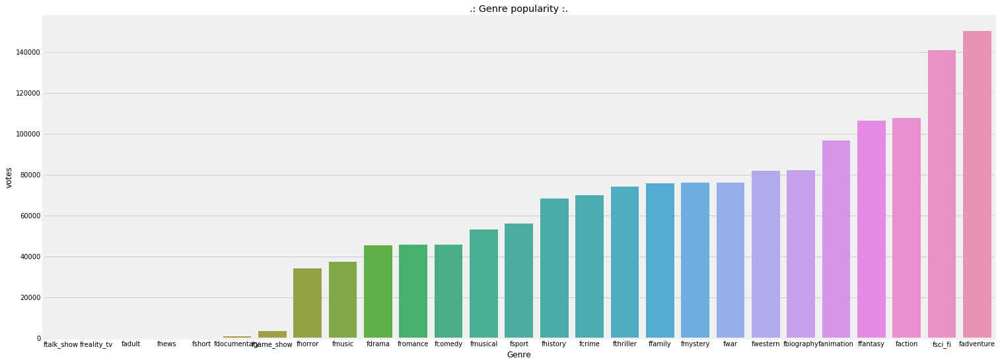

In [46]:
f, ax = plt.subplots(figsize=(23, 9))
sns.barplot(x = 'Genre', y = 'votes', data=genre_discription.sort_values(by=['votes']))
ax.set_title('.: Genre popularity :.')
ax.set_xlabel('Genre')
ax.set_ylabel('votes')
plt.show()

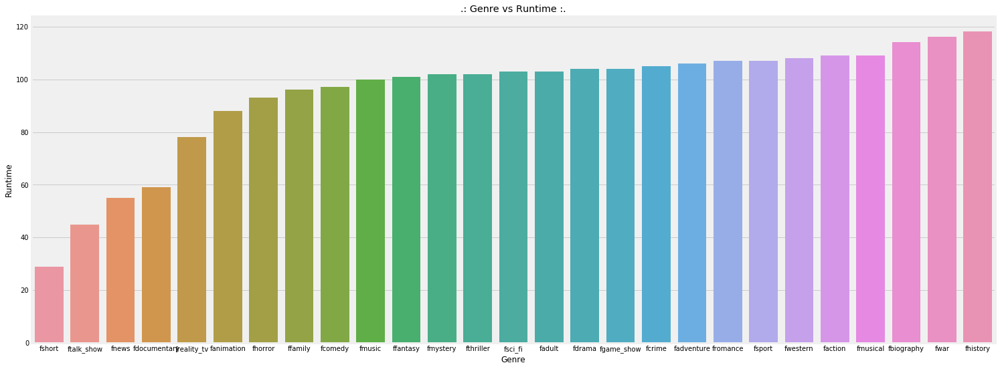

In [44]:
f, ax = plt.subplots(figsize=(23, 9))
sns.barplot(x = 'Genre', y = 'runtime', data=genre_discription.sort_values(by=['runtime']))
ax.set_title('.: Genre vs Runtime :.')
ax.set_xlabel('Genre')
ax.set_ylabel('Runtime')
plt.show()

In [16]:
df.columns

Index(['fid', 'fname', 'fruntime', 'fimdb_rating', 'fimdb_votes', 'fimd',
       'fdirector', 'fwriter', 'fassistant_directors', 'fcinematographers',
       'fcomposers', 'feditors', 'fproducer', 'fenglish', 'fmulti_lang', 'fus',
       'fmulti_country', 'fbiography', 'fshort', 'fdrama', 'fcomedy', 'fnews',
       'fcrime', 'fadventure', 'fgame_show', 'ffantasy', 'fthriller',
       'fmystery', 'fromance', 'fwestern', 'fmusic', 'freality_tv',
       'fanimation', 'fadult', 'fsci_fi', 'ffamily', 'ftalk_show', 'fmusical',
       'fsport', 'fhistory', 'fhorror', 'fwar', 'faction', 'fdocumentary',
       'actW', 'nominated', 'Won', 'month', 'year', 'temp', 'genre_lables',
       'certificate_G', 'certificate_PG', 'certificate_PG-13', 'certificate_R',
       'certificate_Unrated', 'fproduction_Columbia Pictures',
       'fproduction_Dimension Films', 'fproduction_DreamWorks',
       'fproduction_Fox 2000 Pictures', 'fproduction_Fox Searchlight Pictures',
       'fproduction_Lionsgate', 'fpr

In [28]:
dummy_finances(df,certeficate)

,Genre,budget_avg,Gross_avg,cumilative_avg,fimdb_rating,runtime,votes
0,certificate_G,55273250,178066542,157902058,6,91,88176
1,certificate_PG,51386287,150433570,147602406,5,98,66373
2,certificate_PG-13,48321223,121913852,122082162,5,107,112302
3,certificate_R,16620812,168924834,21866300,5,98,39170
4,certificate_Unrated,9242733,229442086,5657248,4,94,6556


In [24]:
certeficate_info = dummy_finances(df,certeficate)

NameError: name 'certeficate' is not defined

In [58]:
certeficate_info.set_index(['Genre'],inplace=True)
certeficate_info.head()

,budget_avg,Gross_avg,cumilative_avg
Genre,,,
certificate_G,55273250,178066542,157902058
certificate_PG,51386287,150433570,147602406
certificate_PG-13,48321223,121913852,122082162
certificate_R,16620812,168924834,21866300
certificate_Unrated,9242733,229442086,5657248


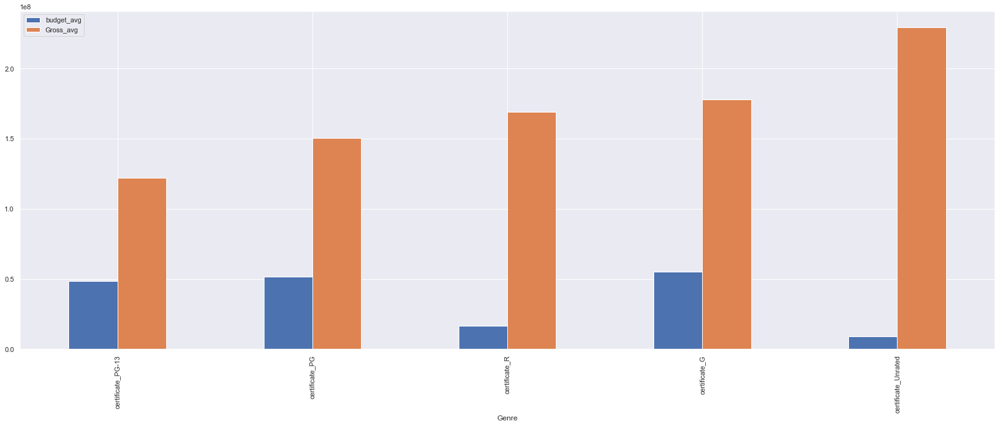

In [59]:
certeficate_info[['budget_avg','Gross_avg']].sort_values(by=['Gross_avg']).plot(kind='bar',figsize=(25,10))

In [30]:
production = df[['fproduction_Columbia Pictures', 'fproduction_Dimension Films',
        'fproduction_DreamWorks', 'fproduction_Fox 2000 Pictures',
        'fproduction_Fox Searchlight Pictures', 'fproduction_Lionsgate',
        'fproduction_New Line Cinema', 'fproduction_Paramount Pictures',
        'fproduction_Screen Gems', 'fproduction_Summit Entertainment',
        'fproduction_Touchstone Pictures', 'fproduction_Twentieth Century Fox',
        'fproduction_Universal Pictures', 'fproduction_Walt Disney Pictures',
        'fproduction_Warner Bros']] #'fproduction_other'

In [31]:
production_info = dummy_finances(df,production)

In [32]:
production_info.head()

,Genre,budget_avg,Gross_avg,cumilative_avg,fimdb_rating,runtime,votes
0,fproduction_Columbia Pictures,67572680,81563927,185374778,6,110,163391
1,fproduction_Dimension Films,55309258,66196309,64047766,5,98,104201
2,fproduction_DreamWorks,48194000,55784087,115694131,6,115,137804
3,fproduction_Fox 2000 Pictures,48038210,61528210,140383477,6,108,100725
4,fproduction_Fox Searchlight Pictures,31386392,27796918,56317050,6,104,133372


In [70]:
production_info.set_index(['Genre'],inplace=True)
production_info.head()

,budget_avg,Gross_avg,cumilative_avg
Genre,,,
fproduction_Columbia Pictures,67572680,81563927,185374778
fproduction_Dimension Films,55309258,66196309,64047766
fproduction_DreamWorks,48194000,55784087,115694131
fproduction_Fox 2000 Pictures,48038210,61528210,140383477
fproduction_Fox Searchlight Pictures,31386392,27796918,56317050


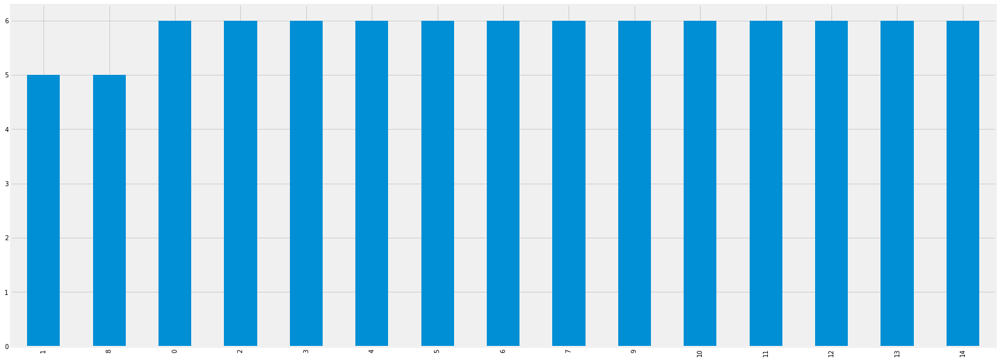

In [34]:
production_info['fimdb_rating'].sort_values().plot(kind='bar',figsize=(25,10))

In [151]:
df.columns

Index(['fid', 'fname', 'fruntime', 'fimdb_rating', 'fimdb_votes', 'fimd',
       'fdirector', 'fwriter', 'fassistant_directors', 'fcinematographers',
       'fcomposers', 'feditors', 'fproducer', 'fenglish', 'fmulti_lang', 'fus',
       'fmulti_country', 'fbiography', 'fshort', 'fdrama', 'fcomedy', 'fnews',
       'fcrime', 'fadventure', 'fgame_show', 'ffantasy', 'fthriller',
       'fmystery', 'fromance', 'fwestern', 'fmusic', 'freality_tv',
       'fanimation', 'fadult', 'fsci_fi', 'ffamily', 'ftalk_show', 'fmusical',
       'fsport', 'fhistory', 'fhorror', 'fwar', 'faction', 'fdocumentary',
       'actW', 'nominated', 'Won', 'month', 'year', 'temp', 'genre_lables',
       'certificate_G', 'certificate_PG', 'certificate_PG-13', 'certificate_R',
       'certificate_Unrated', 'fproduction_Columbia Pictures',
       'fproduction_Dimension Films', 'fproduction_DreamWorks',
       'fproduction_Fox 2000 Pictures', 'fproduction_Fox Searchlight Pictures',
       'fproduction_Lionsgate', 'fpr

### Production companies

In [124]:
prod_comp = eda_data[eda_data['production'] != 'other']
prod_count = prod_comp['fproduction'].value_counts().sort_index()
df_gCount = pd.DataFrame({'production': prod_count.index, 'count': prod_count.values})
f, ax = plt.subplots(figsize=(23, 9))
sns.barplot(x = 'count', y = 'production', data=df_gCount)
ax.set_title('.: occurences per production coumpany :.')
ax.set_xlabel('occurrences')
ax.set_ylabel('genres')
plt.show()


KeyError: 'production'

In [34]:
prod_comp = eda_data[eda_data['fproduction'] != 'other']

In [39]:
category_financial = prod_comp[['fGross_y','fbudget_y','fcumlative_y']].groupby(prod_comp['fproduction'])
financial_df=pd.DataFrame(category_financial.sum())
sorted_profit=financial_df.sort_values('fcumlative_y',ascending=False)
sorted_profit.head()

,fGross_y,fbudget_y,fcumlative_y
fproduction,,,
Warner Bros,1.382027e+10,1.147198e+10,3.298980e+10
Universal Pictures,1.246194e+10,8.939609e+09,2.753658e+10
Columbia Pictures,1.117426e+10,9.131980e+09,2.539634e+10
Paramount Pictures,9.730897e+09,8.461544e+09,2.289875e+10
Walt Disney Pictures,8.503322e+09,7.182500e+09,2.188072e+10


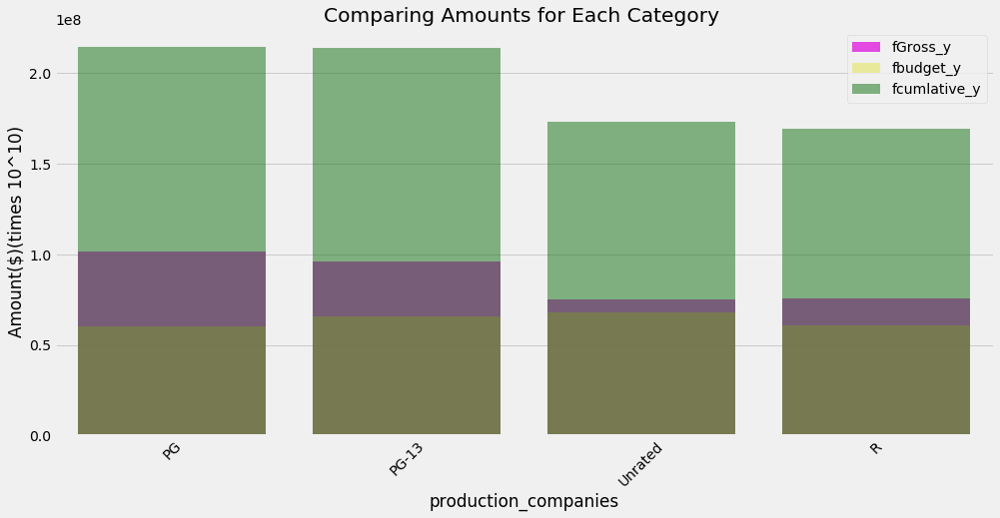

In [100]:
f,ax = plt.subplots(figsize = (15,7))
sns.barplot(x=sorted_profit.index, y=sorted_profit['fGross_y'],color='magenta',alpha = 0.8,label='fGross_y')
sns.barplot(x=sorted_profit.index, y=sorted_profit['fbudget_y'],color='yellow',alpha = 0.4,label='fbudget_y')
sns.barplot(x=sorted_profit.index, y=sorted_profit['fcumlative_y'],color='green',alpha = 0.5,label='fcumlative_y')
plt.xticks(rotation= 45)
ax.legend(loc='upper right',frameon = True)
ax.set(xlabel='certification', ylabel='Amount($)(times 10^10)',title = "Comparing Amounts for Each Category ")
plt.show()

In [129]:
eda_data['certification'].isnull().sum()

7297

### Certificates

In [126]:
eda_data['certification'].value_counts()

R          82
PG-13      35
Unrated    27
PG         10
Name: certification, dtype: int64

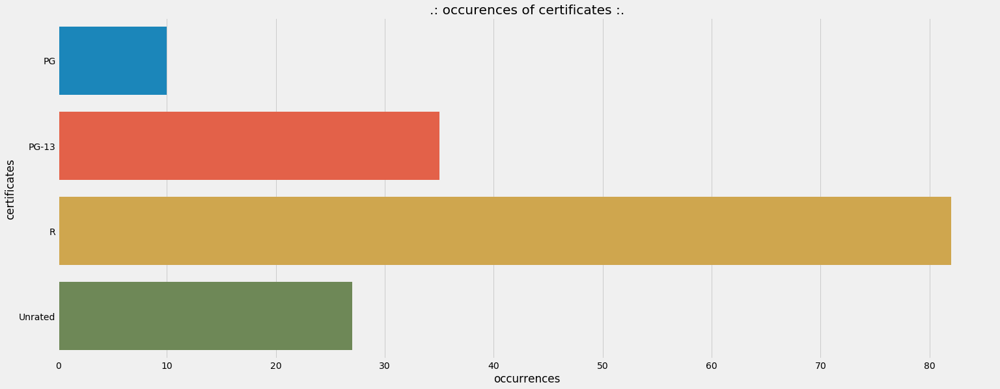

In [128]:
prod_count = eda_data['certification'].value_counts().sort_index()
df_gCount = pd.DataFrame({'production': prod_count.index, 'count': prod_count.values})
f, ax = plt.subplots(figsize=(23, 9))
sns.barplot(x = 'count', y = 'production', data=df_gCount)
ax.set_title('.: occurences of certificates :.')
ax.set_xlabel('occurrences')
ax.set_ylabel('certificates')
plt.show()


In [98]:
category_financial = prod_comp[['fGross_y','fbudget_y','fcumlative_y']].groupby(eda_data['certificate'])
financial_df=pd.DataFrame(category_financial.mean())
sorted_profit=financial_df.sort_values('fcumlative_y',ascending=False)
sorted_profit.head()

,fGross_y,fbudget_y,fcumlative_y
certificate,,,
PG,1.016445e+08,6.007241e+07,2.143133e+08
PG-13,9.581557e+07,6.571548e+07,2.141599e+08
Unrated,7.518681e+07,6.796296e+07,1.730967e+08
R,7.542871e+07,6.080381e+07,1.694135e+08


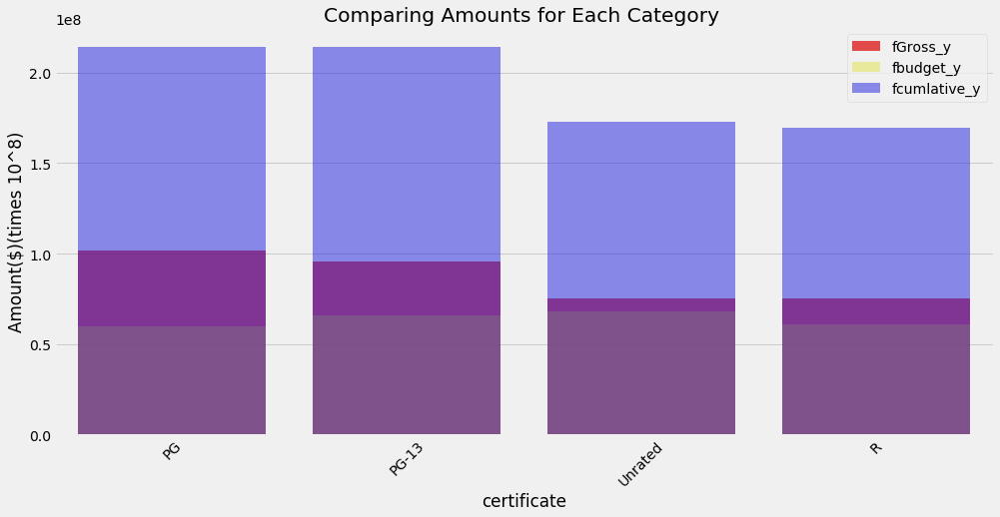

In [99]:
f,ax = plt.subplots(figsize = (15,7))
sns.barplot(x=sorted_profit.index, y=sorted_profit['fGross_y'],color='red',alpha = 0.8,label='fGross_y')
sns.barplot(x=sorted_profit.index, y=sorted_profit['fbudget_y'],color='yellow',alpha = 0.4,label='fbudget_y')
sns.barplot(x=sorted_profit.index, y=sorted_profit['fcumlative_y'],color='blue',alpha = 0.5,label='fcumlative_y')
plt.xticks(rotation= 45)
ax.legend(loc='upper right',frameon = True)
ax.set(xlabel='certificate', ylabel='Amount($)(times 10^8)',title = "Comparing Amounts for Each Category ")
plt.show()

In [84]:
eda_data.columns

Index(['fid', 'fname', 'fruntime', 'fimdb_rating', 'fimdb_votes', 'fimd',
       'fdirector', 'fwriter', 'fassistant_directors', 'fcinematographers',
       'fcomposers', 'feditors', 'fproducer', 'fenglish', 'fmulti_lang', 'fus',
       'fmulti_country', 'fcomedy', 'fadult', 'fdocumentary', 'fmystery',
       'fadventure', 'fbiography', 'fshort', 'fnews', 'fthriller', 'ffamily',
       'fhistory', 'fcrime', 'fhorror', 'ftalk-show', 'fwar', 'fgame-show',
       'freality-tv', 'fwestern', 'faction', 'fmusical', 'fsport', 'fmusic',
       'fanimation', 'fromance', 'fsci-fi', 'ffantasy', 'fdrama', 'actW',
       'nominated', 'Won', 'month', 'year', 'certificate_Not Rated',
       'certificate_PG', 'certificate_PG-13', 'certificate_R',
       'certificate_Unrated', 'fproduction_Columbia Pictures',
       'fproduction_Dimension Films', 'fproduction_DreamWorks',
       'fproduction_Fox 2000 Pictures', 'fproduction_Fox Searchlight Pictures',
       'fproduction_Lionsgate', 'fproduction_New Lin

In [33]:
production_comp.first() 

,fid,fname,fruntime,fimdb_rating,fimdb_votes,fimd,fdirector,fwriter,fassistant_directors,fcinematographers,...,fproduction_Walt Disney Pictures,fproduction_Warner Bros,fproduction_other,fGross_y,fbudget_y,fcumlative_y,fgenre,temp,genre_lables,certificate
fproduction,,,,,,,,,,,,,,,,,,,,,
Columbia Pictures,tt0172156,Bad Boys II,6.6,6.6,210984.0,0.66,0.0,0.0,0.0,0.5,...,0,0,0,138608444.0,130000000.0,273339556.0,"['Action', 'Comedy', 'Crime', 'Thriller']",100000001001000000100000000,23,R
Dimension Films,tt0160399,Impostor,6.2,6.2,21940.0,0.62,0.0,0.0,1.5,2.0,...,0,0,0,6285176.0,30000000.0,8694320.0,"['Drama', 'Mystery', 'Sci-Fi', 'Thriller']",000100001000000000000000101,9,R
DreamWorks,tt0165982,Sinbad: Legend of the Seven Seas,6.7,6.7,45888.0,0.67,0.0,1.0,0.0,0.0,...,0,0,0,26483452.0,60000000.0,80767884.0,"['Animation', 'Adventure', 'Family', 'Fantasy']",000010000100000000000010010,28,PG
Fox 2000 Pictures,tt0244970,Someone Like You...,6.1,6.1,22469.0,0.61,0.0,0.0,0.0,1.0,...,0,0,0,27343067.0,23000000.0,38689940.0,"['Comedy', 'Romance']",100000000000000000000001000,4,PG-13
Fox Searchlight Pictures,tt0243017,Waking Life,7.8,7.8,58009.0,0.78,0.0,1.0,0.0,1.0,...,0,0,0,2901447.0,28550000.0,3176880.0,"['Animation', 'Drama', 'Fantasy']",000000000000000000000010011,0,R
Lionsgate,tt0381849,3:10 to Yuma,7.7,7.7,274456.0,0.77,0.0,0.0,0.0,1.0,...,0,0,0,53606916.0,55000000.0,70016220.0,"['Action', 'Crime', 'Drama', 'Western']",000000000001000001100000001,20,R
New Line Cinema,tt0120737,The Lord of the Rings: The Fellowship of the Ring,8.8,8.8,1551084.0,0.88,0.0,0.0,0.0,1.0,...,0,0,0,315544750.0,93000000.0,872491916.0,"['Adventure', 'Drama', 'Fantasy']",000010000000000000000000011,28,PG
Paramount Pictures,tt0146316,Lara Croft: Tomb Raider,5.8,5.8,189189.0,0.58,0.0,0.0,0.0,0.0,...,0,0,0,131168070.0,115000000.0,274703340.0,"['Action', 'Adventure', 'Fantasy', 'Thriller']",000010001000000000100000010,7,PG-13
Screen Gems,tt0228333,Ghosts of Mars,4.9,4.9,49007.0,0.49,0.0,0.0,0.0,0.0,...,0,0,0,8709640.0,28000000.0,14010832.0,"['Action', 'Horror', 'Sci-Fi']",000000000000100000100000100,6,R


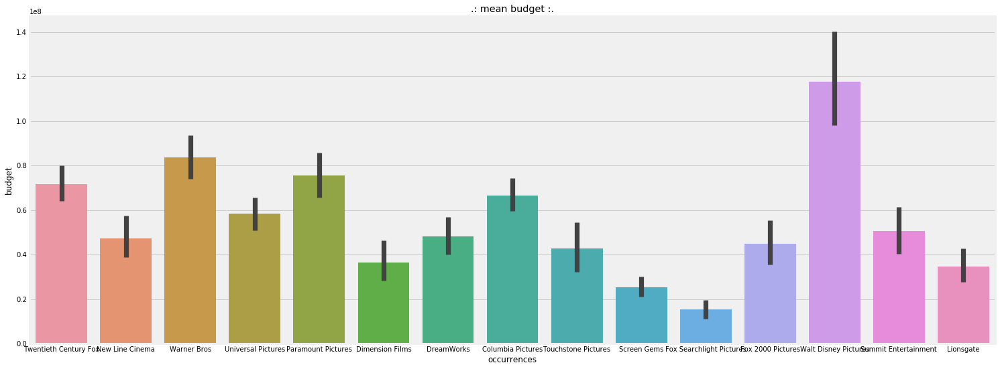

In [26]:
f, ax = plt.subplots(figsize=(23, 9))
prod_comp = eda_data[eda_data['fproduction'] != 'other']
production_comp = prod_comp.groupby('fproduction')
sns.barplot(x = 'fproduction', y = 'fbudget_y', data=prod_comp)
ax.set_title('.: mean budget :.')
ax.set_xlabel('occurrences')
ax.set_ylabel('budget')
plt.show()

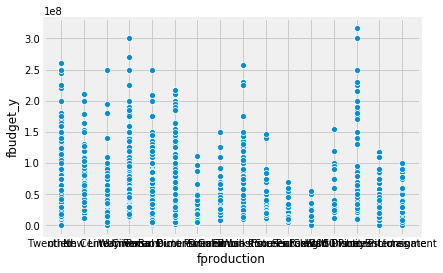

In [15]:
sns.scatterplot(x='fproduction',y='fbudget_y',data=eda_data)

### certificates

In [72]:
cmap=sns.diverging_palette(5, 250, as_cmap=True)
corr = df.corr()
def magnify():
    
    return [dict(selector="th",
                 props=[("font-size", "7pt")]),
            dict(selector="td",
                 props=[('padding', "0em 0em")]),
            dict(selector="th:hover",
                 props=[("font-size", "12pt")]),
            dict(selector="tr:hover td:hover",
                 props=[('max-width', '200px'),
                        ('font-size', '12pt')])
]
corr.style.background_gradient(cmap, axis=1)\
    .set_properties(**{'max-width': '80px', 'font-size': '10pt'})\
    .set_caption("Hover to magify")\
    .set_precision(2)\
    .set_table_styles(magnify())

In [205]:
pwd

'/Users/bader/Dropbox/DSI_GA_Capstone/Code/Bader'

In [ ]:
DSI_GA_Capstone/Code/Bader/EDA_dataAnalysis

In [280]:
pwd

'/Users/bader/Dropbox/DSI_GA_Capstone/Code/Bader'

In [14]:
# import collections 

# genre_sum = []
# genre_count = []
# mul_list_dict = collections.defaultdict(list)
# for i in range(0,df.shape[0]):
#     counter_sum = 0
#     counter_freq = 0
#     for j in genre.columns:
#         if df[j][i] != 0:
#             a = str(df[j])
#             counter_sum+= df['rating'][i] * df[j][i]
#             counter_freq+= 1
#             mul_list_dict['{}_budget'.format(j)].append(df['fbudget_y'][i])
#             mul_list_dict['{}_Gross'.format(j)].append(df['fGross_y'][i])
#             mul_list_dict['{}_cumlative'.format(j)].append(df['fcumlative_y'][i])
            
              
#     genre_sum.append(counter_sum)
#     genre_count.append(counter_freq)
        
# df['total_genre_bud'] = genre_sum
# df['count_genres'] = genre_count


# genre_title = []
# genre_budget = []
# genre_Gross = []
# genre_cumilative = []



# for i in genre:
    
#     genre_title.append(i)
#     genre_budget.append(int((sum(mul_list_dict['{}_budget'.format(i)]))/(len(mul_list_dict['{}_budget'.format(i)]))))
#     genre_Gross.append(int((sum(mul_list_dict['{}_Gross'.format(i)]))/(len(mul_list_dict['{}_Gross'.format(i)]))))
#     genre_cumilative.append(int((sum(mul_list_dict['{}_cumlative'.format(i)]))/(len(mul_list_dict['{}_cumlative'.format(i)]))))
    
#     print('{}'.format(i), 'has an average budget of :'\
#           , (sum(mul_list_dict['{}_budget'.format(i)]))/(len(mul_list_dict['{}_budget'.format(i)])))
    
#     print('{}'.format(i), 'has an average Gross of :'\
#           , (sum(mul_list_dict['{}_Gross'.format(i)]))/(len(mul_list_dict['{}_Gross'.format(i)])))
    
#     print('{}'.format(i), 'has an average cumlative of :'\
#           , (sum(mul_list_dict['{}_cumlative'.format(i)]))/(len(mul_list_dict['{}_cumlative'.format(i)])))
    
#     print('\n')
    

    

    
    
# genre_specs = pd.DataFrame({'Genre':genre_title,'budget_avg':genre_budget,'Gross_avg':genre_Gross,'cumilative_avg':genre_cumilative})

    

In [ ]:
# def dummy_finances(df,array):
#     import collections
    
#     mul_list_dict = collections.defaultdict(list)
    
#     for i in range(0,df.shape[0]):
#         for j in array.columns:
#             if df[j][i] != 0:
#                 a = str(df[j])
#                 mul_list_dict['{}_budget'.format(j)].append(df['fbudget_y'][i])
#                 mul_list_dict['{}_Gross'.format(j)].append(df['fGross_y'][i])
#                 mul_list_dict['{}_cumlative'.format(j)].append(df['fcumlative_y'][i])
                
                
#     genre_title = []
#     genre_budget = []
#     genre_Gross = []
#     genre_cumilative = []
    
#     for i in array:
#         genre_title.append(i)
#         genre_budget.append(int((sum(mul_list_dict['{}_budget'.format(i)]))/(len(mul_list_dict['{}_budget'.format(i)]))))
#         genre_Gross.append(int((sum(mul_list_dict['{}_Gross'.format(i)]))/(len(mul_list_dict['{}_Gross'.format(i)]))))
#         genre_cumilative.append(int((sum(mul_list_dict['{}_cumlative'.format(i)]))/(len(mul_list_dict['{}_cumlative'.format(i)]))))
    
    
#     return pd.DataFrame({'Genre':genre_title,'budget_avg':genre_budget,'Gross_avg':genre_Gross,'cumilative_avg':genre_cumilative})

    